# Time Series of YCSD Covid Case Metric

This notebook examines the time series of the York County COVID Cases ostensibly used by YCSD to make decisions about school reopenings.

* YCSD presents there metrics on https://ycsd.yorkcountyschools.org/domain/1313
* VDH represents the this number for the localities on https://www.vdh.virginia.gov/coronavirus/coronavirus/covid-19-in-virginia-locality/ and on https://www.vdh.virginia.gov/coronavirus/key-measures/pandemic-metrics/school-metrics/ under the localities tab
* VDH shares the data at https://data.virginia.gov/Government/VDH-COVID-19-PublicUseDataset-Cases/bre9-aqqr
* I'm sharing This notebook in Github at https://github.com/drf5n/YCSD_covid_metrics and https://drf5n.github.io/

-- David Forrest


In [1]:
# %matplotlib widget
import os,sys,io, time, pathlib,datetime
import pandas as pd, numpy as np
#import numpy as np, matplotlib as mpl, matplotlib.pyplot as plt

import geopandas
import folium
import bokeh.plotting
import bokeh.io
import bokeh.models
from bokeh.io import output_notebook
bokeh.io.output_notebook()
today_str=datetime.datetime.now().strftime("%m/%d/%Y")

Loading BokehJS ...

In [2]:
def file_age(filepath):
    return time.time() - os.path.getmtime(filepath)


In [3]:
# get the Virginia COVID Case data from https://data.virginia.gov/Government/VDH-COVID-19-PublicUseDataset-Cases/bre9-aqqr

df_name = "VA_vdh_casedata.csv"
if file_age(df_name) > 86400:
    !wget -O $df_name 'https://data.virginia.gov/api/views/bre9-aqqr/rows.csv?accessType=DOWNLOAD'
    pathlib(df_name).touch()

In [4]:
df=pd.read_csv(df_name)
df["date"] = pd.to_datetime(df['Report Date'])

if not df.iloc[-1]['Report Date'] == today_str:
    print(f'Datafile "{df_name}" not up to date')
    df.tail()

In [5]:
# get the daily and 14 day sums for each locality
df = df.sort_values(by=['Locality', 'VDH Health District', 'date'])
display(df.head())

df['TC_diff']= df.groupby('Locality')['Total Cases'].diff().fillna(0)
df['TC_sum14']= df.groupby('Locality')['Total Cases'].diff(14).fillna(0)
df['TC_sum28']= df.groupby('Locality')['Total Cases'].diff(28).fillna(0)

display(df.tail())



,Report Date,FIPS,Locality,VDH Health District,Total Cases,Hospitalizations,Deaths,date
0,03/17/2020,51001,Accomack,Eastern Shore,0,0,0,2020-03-17
133,03/18/2020,51001,Accomack,Eastern Shore,0,0,0,2020-03-18
266,03/19/2020,51001,Accomack,Eastern Shore,0,0,0,2020-03-19
399,03/20/2020,51001,Accomack,Eastern Shore,1,0,0,2020-03-20
532,03/21/2020,51001,Accomack,Eastern Shore,1,0,0,2020-03-21


,Report Date,FIPS,Locality,VDH Health District,Total Cases,Hospitalizations,Deaths,date,TC_diff,TC_sum14,TC_sum28
35871,12/11/2020,51199,York,Peninsula,1046,32,9,2020-12-11,8.0,169.0,322.0
36004,12/12/2020,51199,York,Peninsula,1069,32,9,2020-12-12,23.0,180.0,334.0
36137,12/13/2020,51199,York,Peninsula,1089,32,9,2020-12-13,20.0,181.0,344.0
36270,12/14/2020,51199,York,Peninsula,1105,32,9,2020-12-14,16.0,184.0,346.0
36403,12/15/2020,51199,York,Peninsula,1129,32,9,2020-12-15,24.0,200.0,362.0


In [6]:
# subset for York and normalize per capita
dfy = df[df['Locality']=='York'].copy()
dfy['per100k_14daysum']=dfy['TC_sum14']*100000/67782  

In [7]:
dfy

,Report Date,FIPS,Locality,VDH Health District,Total Cases,Hospitalizations,Deaths,date,TC_diff,TC_sum14,TC_sum28,per100k_14daysum
94,03/17/2020,51199,York,Peninsula,1,0,1,2020-03-17,0.0,0.0,0.0,0.000000
227,03/18/2020,51199,York,Peninsula,1,1,1,2020-03-18,0.0,0.0,0.0,0.000000
360,03/19/2020,51199,York,Peninsula,1,1,1,2020-03-19,0.0,0.0,0.0,0.000000
493,03/20/2020,51199,York,Peninsula,3,1,1,2020-03-20,2.0,0.0,0.0,0.000000
626,03/21/2020,51199,York,Peninsula,3,1,1,2020-03-21,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
35871,12/11/2020,51199,York,Peninsula,1046,32,9,2020-12-11,8.0,169.0,322.0,249.328730
36004,12/12/2020,51199,York,Peninsula,1069,32,9,2020-12-12,23.0,180.0,334.0,265.557228
36137,12/13/2020,51199,York,Peninsula,1089,32,9,2020-12-13,20.0,181.0,344.0,267.032546
36270,12/14/2020,51199,York,Peninsula,1105,32,9,2020-12-14,16.0,184.0,346.0,271.458499


<AxesSubplot:title={'center':'York County Number of new cases per 100,000 persons \nwithin the last 14 days'}, xlabel='date'>

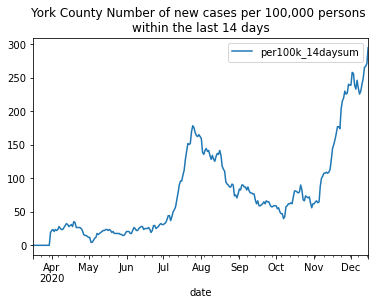

In [8]:
ph = dfy.plot(y='per100k_14daysum',x='date',title="York County Number of new cases per 100,000 persons \nwithin the last 14 days")

ph

<AxesSubplot:title={'center':'York County Cases, 14 day sum, per 100K'}, xlabel='date'>

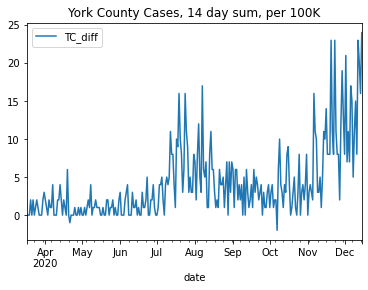

In [9]:
ph = dfy.plot(y='TC_diff',x='date',title="York County Cases, 14 day sum, per 100K")
ph

In [10]:
TOOLTIPS = [
 #   ("index", "$index"),
 #   ("date:", "$x{%F %T}"),
    ("date:", "@date{%F}"),
    ("cases/14d/100k:","@per100k_14daysum"),
 #   ("(x,y)", "($x, $y)"),
]


#p=bokeh.plotting.figure( tooltips=TOOLTIPS, x_axis_type='datetime')
p=bokeh.plotting.figure( x_axis_type='datetime',y_range=(0,300),
#                        tooltips=TOOLTIPS,formatters={"$x": "datetime"},
                        title="York County Number of new cases per 100,000 persons within the last 14 days")

    
hth = bokeh.models.HoverTool(tooltips=TOOLTIPS,
                             formatters={"$x": "datetime",
                                        "@date": "datetime"
                                        },
                             mode='vline',
                            )

print(hth)
print(hth.formatters)
p.add_tools(hth)
#hover = p.select(dict(type=bokeh.models.HoverTool))


#hover(tooltips=TOOLTIPS,
#)

p.add_layout(bokeh.models.BoxAnnotation(bottom=0,top=5, fill_alpha=0.4, fill_color='olive'))
p.add_layout(bokeh.models.BoxAnnotation(bottom=5,top=20, fill_alpha=0.4, fill_color='green'))
p.add_layout(bokeh.models.BoxAnnotation(bottom=20,top=50, fill_alpha=0.4, fill_color='yellow'))
p.add_layout(bokeh.models.BoxAnnotation(bottom=50,top=200, fill_alpha=0.4, fill_color='orange'))
p.add_layout(bokeh.models.BoxAnnotation(bottom=200, fill_alpha=0.4, fill_color='red'))



#p.line(dfy['date'],dfy['per100k_14daysum'])
p.line(x='date', y='per100k_14daysum',source=dfy)
#p.title()

#?p.line

HoverTool(id='1035', ...)
{'$x': 'datetime', '@date': 'datetime'}


GlyphRenderer(id='1046', ...)

In [11]:
bokeh.plotting.show(p)

In [12]:
#bokeh.plotting.output_file('YorkCountyCovidMetric_plot.html', mode='inline')
#bokeh.plotting.save(p)

# needs geckodriver  -- have it in conda env py3plot
#bokeh.io.export_png(p, filename="YorkCountyCovidMetric_plot.png")



In [13]:
## Save notebook as a python script:
#! jupyter nbconvert --to script AllCountyCovidMetric.ipynb

In [14]:
# Collect populations
coest= pd.read_csv("/Users/drf/Downloads/co-est2019-alldata.csv", encoding='latin-1')
coest['FIPS']=coest['STATE']*1000+coest['COUNTY']
coest['FIPSstr']=coest['FIPS'].astype(str)

In [15]:
coestva=coest[coest['STNAME']=="Virginia"].copy()

In [16]:
coestva.FIPS.iloc[0]

51000

In [17]:
pd.set_option('display.max_rows', 500)

display(coestva[['FIPS','CTYNAME','POPESTIMATE2019']])

,FIPS,CTYNAME,POPESTIMATE2019
2866,51000,Virginia,8535519
2867,51001,Accomack County,32316
2868,51003,Albemarle County,109330
2869,51005,Alleghany County,14860
2870,51007,Amelia County,13145
2871,51009,Amherst County,31605
2872,51011,Appomattox County,15911
2873,51013,Arlington County,236842
2874,51015,Augusta County,75558
2875,51017,Bath County,4147


In [50]:
# Normalize by population

display(df.columns)
dfpop = pd.merge(df,coestva[['FIPS','FIPSstr','CTYNAME','POPESTIMATE2019']], left_on=['FIPS'], 
                      right_on=['FIPS'],
                      how='left', sort=False)
#dfpop.set_index(['Locality','Report Date'],inplace=True)

#display(dfpop)

dfpop['caseP14P100k']=dfpop['TC_sum14']/dfpop['POPESTIMATE2019']*100000
dfpop['caseP28P100k']=dfpop['TC_sum28']/dfpop['POPESTIMATE2019']*100000


today_pop=dfpop[dfpop['Report Date']==today_str].copy()
today_pop['rank']=(-today_pop['caseP14P100k']).rank()

display(today_pop.tail(1))
display(today_pop.sort_values(by=['rank']))

Index(['Report Date', 'FIPS', 'Locality', 'VDH Health District', 'Total Cases',
       'Hospitalizations', 'Deaths', 'date', 'TC_diff', 'TC_sum14',
       'TC_sum28'],
      dtype='object')

,Report Date,FIPS,Locality,VDH Health District,Total Cases,Hospitalizations,Deaths,date,TC_diff,TC_sum14,TC_sum28,FIPSstr,CTYNAME,POPESTIMATE2019
0,03/17/2020,51001,Accomack,Eastern Shore,0,0,0,2020-03-17,0.0,0.0,0.0,51001,Accomack County,32316
1,03/18/2020,51001,Accomack,Eastern Shore,0,0,0,2020-03-18,0.0,0.0,0.0,51001,Accomack County,32316
2,03/19/2020,51001,Accomack,Eastern Shore,0,0,0,2020-03-19,0.0,0.0,0.0,51001,Accomack County,32316
3,03/20/2020,51001,Accomack,Eastern Shore,1,0,0,2020-03-20,1.0,0.0,0.0,51001,Accomack County,32316
4,03/21/2020,51001,Accomack,Eastern Shore,1,0,0,2020-03-21,0.0,0.0,0.0,51001,Accomack County,32316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36437,12/11/2020,51199,York,Peninsula,1046,32,9,2020-12-11,8.0,169.0,322.0,51199,York County,68280
36438,12/12/2020,51199,York,Peninsula,1069,32,9,2020-12-12,23.0,180.0,334.0,51199,York County,68280
36439,12/13/2020,51199,York,Peninsula,1089,32,9,2020-12-13,20.0,181.0,344.0,51199,York County,68280
36440,12/14/2020,51199,York,Peninsula,1105,32,9,2020-12-14,16.0,184.0,346.0,51199,York County,68280


,Report Date,FIPS,Locality,VDH Health District,Total Cases,Hospitalizations,Deaths,date,TC_diff,TC_sum14,TC_sum28,FIPSstr,CTYNAME,POPESTIMATE2019,caseP14P100k,caseP28P100k,rank
36441,12/15/2020,51199,York,Peninsula,1129,32,9,2020-12-15,24.0,200.0,362.0,51199,York County,68280,292.911541,530.169889,117.0


,Report Date,FIPS,Locality,VDH Health District,Total Cases,Hospitalizations,Deaths,date,TC_diff,TC_sum14,TC_sum28,FIPSstr,CTYNAME,POPESTIMATE2019,caseP14P100k,caseP28P100k,rank
3287,12/15/2020,51021,Bland,Mount Rogers,380,9,6,2020-12-15,5.0,179.0,273.0,51021,Bland County,6280,2850.318471,4347.133758,1.0
7945,12/15/2020,51580,Covington,Alleghany,281,7,3,2020-12-15,13.0,117.0,178.0,51580,Covington city,5538,2112.676056,3214.156735,2.0
4931,12/15/2020,51530,Buena Vista City,Central Shenandoah,409,13,2,2020-12-15,3.0,134.0,220.0,51530,Buena Vista city,6478,2068.539673,3396.109910,3.0
24659,12/15/2020,51135,Nottoway,Piedmont,819,61,24,2020-12-15,1.0,307.0,368.0,51135,Nottoway County,15232,2015.493697,2415.966387,4.0
13151,12/15/2020,51640,Galax,Mount Rogers,687,51,30,2020-12-15,5.0,113.0,181.0,51640,Galax city,6347,1780.368678,2851.740980,5.0
9315,12/15/2020,51051,Dickenson,Cumberland Plateau,503,20,3,2020-12-15,16.0,229.0,293.0,51051,Dickenson County,14318,1599.385389,2046.375192,6.0
2465,12/15/2020,51015,Augusta,Central Shenandoah,2414,57,19,2020-12-15,62.0,1183.0,1500.0,51015,Augusta County,75558,1565.684640,1985.229890,7.0
4657,12/15/2020,51029,Buckingham,Piedmont,1161,37,10,2020-12-15,1.0,261.0,340.0,51029,Buckingham County,17148,1522.043387,1982.738512,8.0
33701,12/15/2020,51185,Tazewell,Cumberland Plateau,1631,60,8,2020-12-15,82.0,543.0,826.0,51185,Tazewell County,40595,1337.603153,2034.733342,9.0
30413,12/15/2020,51167,Russell,Cumberland Plateau,1163,74,11,2020-12-15,46.0,346.0,471.0,51167,Russell County,26586,1301.436846,1771.609118,10.0


In [19]:
# from http://docs.bokeh.org/en/0.11.0/docs/gallery/choropleth.html
# bokeh.sampledata.download()
from bokeh.plotting import figure, show, output_file
from bokeh.sampledata.us_counties import data as counties
from bokeh.sampledata.us_states import data as states
from bokeh.sampledata.unemployment import data as unemployment

if 0: # bokeh chorpleths are less rich than folium annoated geojsons

    INC_STATES = ('VA')

    EXCLUDED = ("ak", "hi", "pr", "gu", "vi", "mp", "as")
    INCLUDED = ('va')

    state_xs = [states[code]["lons"] for code in states if code in INC_STATES]
    state_ys = [states[code]["lats"] for code in states if code in INC_STATES]

    county_xs=[counties[code]["lons"] for code in counties if counties[code]["state"]  in INCLUDED]
    county_ys=[counties[code]["lats"] for code in counties if counties[code]["state"]  in INCLUDED]

    colors = ["#F1EEF6", "#D4B9DA", "#C994C7", "#DF65B0", "#DD1C77", "#980043"]


In [20]:
if 0:
    county_colors = []
    for county_id in counties:
        if counties[county_id]["state"] not in INCLUDED:
            continue
        try:
            rate = unemployment[county_id]
            idx = int(rate/6)
            county_colors.append(colors[idx])
        except KeyError:
            county_colors.append("black")

    p = figure(title="US Unemployment 2009", toolbar_location="left",
               plot_width=1100, plot_height=700)

    p.patches(county_xs, county_ys,
              fill_color=county_colors, fill_alpha=0.7,
              line_color="white", line_width=0.5)

    p.patches(state_xs, state_ys, fill_alpha=0.0,
              line_color="#884444", line_width=2, line_alpha=0.3)

    output_file("choropleth.html", title="choropleth.py example")

    show(p)

In [21]:
 
# Load the shape of the zone (US states)
# Find the original file here: https://github.com/python-visualization/folium/tree/master/examples/data
# You have to download this file and set the directory where you saved it
state_geo = os.path.join('/Users/drf/Downloads/', 'counties.geojson')
 
# Load the unemployment value of each state
# Find the original file here: https://github.com/python-visualization/folium/tree/master/examples/data
#state_unemployment = os.path.join('/Users/y.holtz/Desktop/', 'US_Unemployment_Oct2012.csv')
#state_data = pd.read_csv(state_unemployment)
 
# Initialize the map:


# folium choropleths are less rich than annotated geojsons
# Add the color for the chloropleth:
if 0:
    m = folium.Map(location=[37.9, -77.9], zoom_start=7)
    m.choropleth(
     geo_data=state_geo,
     name='CovidCasesperfortnight100k',
     data=today_pop,
     columns=['FIPSstr', 'caseP14P100k'],
    # columns=['FIPS', 'POPESTIMATE2019'],
     key_on='feature.properties.GEOID',
     fill_color='YlOrRd',
     fill_opacity=0.7,
     line_opacity=0.2,
     legend_name='New Cases/14day/100k',
     bins=[5,20,50, 200,1700]

    )
#folium.LayerControl().add_to(m)


In [22]:
state = geopandas.read_file(state_geo)

In [23]:
today_pop
today_pop.set_index("FIPS").join(state.set_index('GEOID'))

x = state.set_index('GEOID').join(today_pop.set_index("FIPSstr"))

display(x.tail())

,OBJECTID,COUNTYNS,NAMELSAD,CLASSFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,...,Deaths,date,TC_diff,TC_sum14,TC_sum28,CTYNAME,POPESTIMATE2019,caseP14P100k,caseP28P100k,rank
GEOID,,,,,,,,,,,,,,,,,,,,,
51570,129,01498420,Colonial Heights city,C7,F,1.947523e+07,766910.0,+37.2616846,-77.3968043,"MULTIPOLYGON (((-77.43180 37.27560, -77.43180 ...",...,26,2020-12-15,5.0,88.0,149.0,Colonial Heights city,17370,506.620610,857.800806,77.0
51810,130,01498559,Virginia Beach city,C7,F,6.338286e+08,654687358.0,+36.7799845,-76.0252078,"MULTIPOLYGON (((-76.22776 36.83385, -76.22686 ...",...,126,2020-12-15,126.0,2354.0,3868.0,Virginia Beach city,449974,523.141337,859.605222,74.0
51103,131,01480139,Lancaster County,H1,A,3.452389e+08,254114185.0,+37.7048433,-76.4126628,"MULTIPOLYGON (((-76.58684 37.81218, -76.58671 ...",...,2,2020-12-15,1.0,30.0,51.0,Lancaster County,10603,282.938791,480.995945,120.0
51159,132,01480164,Richmond County,H1,A,4.959254e+08,64458631.0,+37.9428936,-76.7305609,"MULTIPOLYGON (((-76.86416 37.95683, -76.86539 ...",...,5,2020-12-15,-11.0,106.0,177.0,Richmond County,9023,1174.775574,1961.653552,12.0
51117,133,01500747,Mecklenburg County,H1,A,1.619544e+09,139655805.0,+36.6872563,-78.3689592,"MULTIPOLYGON (((-78.37771 36.85930, -78.37739 ...",...,37,2020-12-15,13.0,104.0,162.0,Mecklenburg County,30587,340.013731,529.636774,111.0


In [24]:
x['foreign']= pd.cut(x['caseP28P100k'],
                       bins=[-1,5,20,100,50000],
                       labels=['Level 1, Low:  All travelers should wear a mask, stay at least 6 feet from people who are not from your household, wash your hands often or use hand sanitizer, and watch your health for signs of illness.',
                                'Level 2, Moderate: Travelers at increased risk for severe illness from COVID-19 should avoid all nonessential travel.',
                                'Level 3, High: Travelers should avoid all nonessential travel',
                                'Level 4, Very High: Travelers should avoid all travel',
                              ]).astype(str)
x['school']= pd.cut(x['caseP14P100k'],
                       bins=[-1,5,20,50,200,50000],
                       labels=['Lowest risk of transmission in schools',
                                'Lower risk of transmission in schools',
                                'Moderate risk of transmission in schools',
                                'Higher risk of transmission in schools',
                                'Highest risk of transmission in schools',
                              ]).astype(str)

x.tail()

,OBJECTID,COUNTYNS,NAMELSAD,CLASSFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,...,TC_diff,TC_sum14,TC_sum28,CTYNAME,POPESTIMATE2019,caseP14P100k,caseP28P100k,rank,foreign,school
GEOID,,,,,,,,,,,,,,,,,,,,,
51570,129,01498420,Colonial Heights city,C7,F,1.947523e+07,766910.0,+37.2616846,-77.3968043,"MULTIPOLYGON (((-77.43180 37.27560, -77.43180 ...",...,5.0,88.0,149.0,Colonial Heights city,17370,506.620610,857.800806,77.0,"Level 4, Very High: Travelers should avoid all...",Highest risk of transmission in schools
51810,130,01498559,Virginia Beach city,C7,F,6.338286e+08,654687358.0,+36.7799845,-76.0252078,"MULTIPOLYGON (((-76.22776 36.83385, -76.22686 ...",...,126.0,2354.0,3868.0,Virginia Beach city,449974,523.141337,859.605222,74.0,"Level 4, Very High: Travelers should avoid all...",Highest risk of transmission in schools
51103,131,01480139,Lancaster County,H1,A,3.452389e+08,254114185.0,+37.7048433,-76.4126628,"MULTIPOLYGON (((-76.58684 37.81218, -76.58671 ...",...,1.0,30.0,51.0,Lancaster County,10603,282.938791,480.995945,120.0,"Level 4, Very High: Travelers should avoid all...",Highest risk of transmission in schools
51159,132,01480164,Richmond County,H1,A,4.959254e+08,64458631.0,+37.9428936,-76.7305609,"MULTIPOLYGON (((-76.86416 37.95683, -76.86539 ...",...,-11.0,106.0,177.0,Richmond County,9023,1174.775574,1961.653552,12.0,"Level 4, Very High: Travelers should avoid all...",Highest risk of transmission in schools
51117,133,01500747,Mecklenburg County,H1,A,1.619544e+09,139655805.0,+36.6872563,-78.3689592,"MULTIPOLYGON (((-78.37771 36.85930, -78.37739 ...",...,13.0,104.0,162.0,Mecklenburg County,30587,340.013731,529.636774,111.0,"Level 4, Very High: Travelers should avoid all...",Highest risk of transmission in schools


In [25]:
state.tail()

,OBJECTID,COUNTYNS,GEOID,NAMELSAD,CLASSFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
128,129,01498420,51570,Colonial Heights city,C7,F,1.947523e+07,766910.0,+37.2616846,-77.3968043,"MULTIPOLYGON (((-77.43180 37.27560, -77.43180 ..."
129,130,01498559,51810,Virginia Beach city,C7,F,6.338286e+08,654687358.0,+36.7799845,-76.0252078,"MULTIPOLYGON (((-76.22776 36.83385, -76.22686 ..."
130,131,01480139,51103,Lancaster County,H1,A,3.452389e+08,254114185.0,+37.7048433,-76.4126628,"MULTIPOLYGON (((-76.58684 37.81218, -76.58671 ..."
131,132,01480164,51159,Richmond County,H1,A,4.959254e+08,64458631.0,+37.9428936,-76.7305609,"MULTIPOLYGON (((-76.86416 37.95683, -76.86539 ..."
132,133,01500747,51117,Mecklenburg County,H1,A,1.619544e+09,139655805.0,+36.6872563,-78.3689592,"MULTIPOLYGON (((-78.37771 36.85930, -78.37739 ..."


In [26]:
import branca # for a colorscale


url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
county_data = f'{url}/us_county_data.csv'
county_geo = f'{url}/us_counties_20m_topo.json'



colorscale = branca.colormap.linear.YlOrRd_09.scale(0, 200)
colorscale = branca.colormap.linear.YlOrRd_09.to_step(index=[0,5,20,50, 200,500, 1000])
colorscale = branca.colormap.StepColormap(
    ['blue','green','yellow','orange','red','purple','black'], 
    index=[0,5,20,50,200,500,1000], caption='caption',vmin=0, vmax=1200,
)

colorscale=colorscale.to_linear()
#employed_series = x.set_index('FIPSstr')['caseP14P100k']

def style_function(feature):
    y=feature['properties']['caseP14P100k']
   # print(feature)
    return {
        'fillOpacity': 0.5,
        'weight': 0,
        'fillColor': '#black' if y is None else colorscale(y)
    }
colorscale

In [27]:

#write the combined data to a file to be read
x.to_file("vaCovidCounties.geojson", driver='GeoJSON')


# Make a map out of it:
m = folium.Map(location=[37.9, -77.9], zoom_start=7)

loc = """Virginia COVID risk per CDC <a href="https://www.cdc.gov/coronavirus/2019-ncov/travelers/map-and-travel-notices.html">Foreign Travel</a> 
      and <a href="https://www.cdc.gov/coronavirus/2019-ncov/community/schools-childcare/indicators.html#interpretation">School</a> Risk Categories</a>"""
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             <a href="https://github.com/drf5n/YCSD_covid_metrics">(source code)</a>
             '''.format(loc)   

folium.GeoJson(
    "vaCovidCounties.geojson",
    name='geojson',
    style_function=style_function,
    highlight_function=lambda x: {'weight': 2, 'color':'black', 'fillOpacity': 0.4,},
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Locality','date',"VDH Health District",'caseP14P100k','school','caseP28P100k','foreign',"POPESTIMATE2019"],
   #         fields=['name',"date",'per100k_28daysum','per100k_14daysum',"POPESTIMATE2019",'foreign','school'],
   #     aliases=['State','Date','Cases/28d/100kpop','Cases/14d/100kpop','2019 Population','CDC Foreign Travel Rec.','CDC School'],),
         aliases=['Locality','Date','VDH District','Cases/14d/100kpop','School Risk','Cases/28d/100kpop','CDC on Travel','Population'],
    ),    
).add_to(m)
m.add_child(colorscale)
m.get_root().html.add_child(folium.Element(title_html))
m.save('docs/va_counties_map.html')
m

In [28]:
x.loc['51775']['caseP14P100k']

588.9095292676179

In [29]:
#pd.describe_option('display')

In [49]:
popxls=pd.read_excel('/Users/drf/Downloads/2018 Pop.xls',header=[3])
popxls['FIPS']=51000+(popxls.loc[:,'Code'].fillna(0)).astype(int)  # eliminate NaNs above?
popxls.tail()

,Code,Region,District,Locality,Population,0,1-4,5-9,10-14,15-17,...,20-24.1,25-34,35-44,45-54,55-64,65-74,75-84,85+,0,FIPS
130,830.0,5.0,21.0,Williamsburg City ...,14896.0,84.0,408.0,479.0,435.0,306.0,...,3176.0,1759.0,1103.0,1114.0,1502.0,1340.0,812.0,280.0,84.0,51830
131,1.0,5.0,22.0,Accomack County ...,32412.0,346.0,1464.0,1886.0,1857.0,1103.0,...,1411.0,3617.0,3322.0,3892.0,5270.0,4451.0,2301.0,886.0,346.0,51001
132,131.0,5.0,22.0,Northampton County ...,11735.0,97.0,459.0,682.0,693.0,370.0,...,522.0,1166.0,1099.0,1276.0,2061.0,1771.0,901.0,426.0,97.0,51131
133,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51000
134,NaN,NaN,NaN,NaN,8517685.0,99261.0,411663.0,514457.0,528362.0,316049.0,...,578812.0,1190306.0,1104883.0,1125384.0,1106872.0,779038.0,384471.0,151892.0,99261.0,51000


In [ ]:
type(m.get_root().html)
